# Predictive Maintenance in Manufacturing: An Exploratory Data Analysis
### Author: Vaisakhan M.N.
### Dataset: AI4I 2020 Predictive Maintenance Dataset (UCI Machine Learning Repository)

<div style="background-color: #f8f9fa; border-left: 5px solid #102a43; padding: 20px; margin: 20px 0px; border-radius: 4px; font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;">
<h2 style="color: #102a43; margin-top: 0px; margin-bottom: 15px;">📑 Table of Contents</h2>
<ul style="list-style-type: none; padding-left: 5px; font-size: 16px; line-height: 2.0;">
    <li><a href="#intro" style="text-decoration: none; color: #0056b3;"><b>1. Introduction</b></a></li>
    <li><a href="#problem" style="text-decoration: none; color: #0056b3;"><b>2. Problem Statement</b></a></li>
    <li><a href="#libraries" style="text-decoration: none; color: #0056b3;"><b>3. Importing Libraries</b></a></li>
    <li><a href="#data-load" style="text-decoration: none; color: #0056b3;"><b>4. Data Loading & Initial Overview</b></a></li>
    <li><a href="#pre-process" style="text-decoration: none; color: #0056b3;"><b>5. Data Pre-processing & Feature Engineering</b></a></li>
    <li><a href="#eda" style="text-decoration: none; color: #0056b3;"><b>6. Exploratory Data Analysis (EDA) & Visualizations</b></a></li>
    <li><a href="#insights" style="text-decoration: none; color: #0056b3;"><b>7. Key Insights & Strategic Recommendations</b></a></li>
</ul>

<hr style="border: 0.5px solid #d9e2ec; margin-top: 20px;">
<p style="font-size: 13px; color: #627d98; margin-bottom: 0px;"><i>Click on any section to jump directly to it.</i></p>
</div>

<a id="intro"></a>
## 1. Introduction

In the modern manufacturing landscape, unexpected equipment breakdown is one of the highest drivers of operational cost and lost production time. The goal of this data analytics project is to facilitate a transition from **reactive maintenance** (fixing machines after they break) to **predictive maintenance** (identifying mechanical stress thresholds to intervene *before* a catastrophic failure occurs). 

By analyzing the physical sensor logs of a CNC milling machine, this project aims to isolate the specific operational envelopes—such as thermal limits, torque-speed interactions, and tool wear thresholds—that directly trigger mechanical breakdowns.

### 📊 Data Source
The data utilized in this project is the **AI4I 2020 Predictive Maintenance Dataset**, sourced from the UCI Machine Learning Repository. It is a highly respected, synthetically generated dataset that accurately reflects true physical and thermodynamic limits observed in real-world industrial milling equipment.

### ⚙️ About the Data
The dataset consists of **10,000 operational records** (rows) and **14 distinct features** (columns). It captures the machine's state across various production runs. Key aspects of the data include:

* **Product Quality Variants:** The machine processes three types of materials—Low (L, 50%), Medium (M, 30%), and High (H, 20%) quality, allowing us to analyze if material grade affects failure rates.
* **Continuous Sensor Telemetry:** The logs capture real-time mechanical and thermal metrics, including *Rotational Speed (RPM)*, *Torque (Nm)*, *Process Temperature (K)*, and *Ambient Air Temperature (K)*.
* **Cumulative Wear Tracking:** A dedicated feature tracks continuous *Tool Wear (minutes)*, providing a timeline for mechanical degradation.
* **Specific Failure Modes:** Rather than a simple binary "Failed/Not Failed" label, the data isolates five distinct root causes of breakdown:
  * **TWF:** Tool Wear Failure
  * **HDF:** Heat Dissipation Failure
  * **PWF:** Power Failure
  * **OSF:** Overstrain Failure
  * **RNF:** Random Failures

Understanding the interplay between these continuous sensor readings and the discrete failure modes forms the foundation of the exploratory data analysis (EDA) that follows.

<a id="#problem"></a>
### 2. Problem Statement
- Equipment failure in heavy machinery directly impacts production output and safety. The objective of this project is to analyze the operational parameters of a milling machine—such as rotational speed, torque, process temperature, and tool wear—to identify underlying patterns that precede machine failure. By understanding the correlations between these mechanical stresses and specific failure modes (e.g., Heat Dissipation, Power Failure, Overstrain), we can recommend data-driven thresholds for predictive maintenance, ultimately reducing unscheduled downtime and optimizing tool life

<a id="libraries"></a>
### 3. Importing Libraries
- First, we will import the standard Python libraries required for data manipulation and visualization

In [1]:
# Essential libraries for data manipulation
import pandas as pd
import numpy as np

# Libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# Set aesthetic styling for plots
sns.set_theme(style="whitegrid", palette="muted")

<a id="data-load"></a>
### 4. Data Loading and Initial Overview
- The dataset has to be loaded and inspect its dimensions, data types, and initial records to understand its structure.

In [2]:
df = pd.read_csv('ai4i2020.csv')

# Display basic information
print(f"Dataset Shape: {df.shape[0]} rows and {df.shape[1]} columns\n")
print("--- Data Types ---")
print(df.dtypes)
print("\n--- First 5 Rows ---")
display(df.head())


Dataset Shape: 10000 rows and 14 columns

--- Data Types ---
UDI                          int64
Product ID                  object
Type                        object
Air temperature [K]        float64
Process temperature [K]    float64
Rotational speed [rpm]       int64
Torque [Nm]                float64
Tool wear [min]              int64
Machine failure              int64
TWF                          int64
HDF                          int64
PWF                          int64
OSF                          int64
RNF                          int64
dtype: object

--- First 5 Rows ---


,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


<a id="pre-process"></a>
### 5. Data Pre-processing & Feature Engineering
#### 5a. Data Pre-processing
- Following the reference project, the data has to be cleaned. This involves checking for null values, handling duplicates, dropping irrelevant identifier columns, and creating derived features that provide deeper mechanical context.

In [3]:
# 1. Checking for Null Values
print("Missing Values per Column -> ")
print(df.isnull().sum())


Missing Values per Column -> 
UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Machine failure            0
TWF                        0
HDF                        0
PWF                        0
OSF                        0
RNF                        0
dtype: int64


#### ✅ Insight on Null value checks - >
- The output confirms that there are zero missing values across all 14 columns. This indicates a high level of data integrity from the sensor logs. Because the dataset is complete, we do not need to apply any imputation techniques (like filling with mean/median) or drop any rows, ensuring we retain 100% of the operational data for our analysis.

In [4]:
# 2. Checking and Dropping Duplicates
duplicate_count = df.duplicated().sum()
print(f"\nNumber of duplicate rows ->  {duplicate_count}")
if duplicate_count > 0:
    df = df.drop_duplicates()
    print("Duplicates removed.")


Number of duplicate rows ->  0


#### ✅Insight on Duplicates -> 
- The dataset contains zero duplicate rows. In an industrial setting, identical sensor readings across multiple timestamps could indicate a frozen sensor or data logging error. The absence of duplicates confirms that each of the 10,000 records represents a distinct, valid operational state of the milling machine, preventing any bias in our future analysis.

In [5]:
# 3. Dropping Irrelevant Columns
# UDI and Product ID do not contribute to predictive operational analysis
df.drop(['UDI', 'Product ID'], axis=1, inplace=True)

#### ✅Insight on Data Reduction -> 
The UDI (Unique Identifier) and Product ID columns were removed because they are administrative labels rather than physical operational parameters. Retaining them would unnecessarily increase the dimensionality of the dataset and could lead machine learning models to find false, spurious correlations with arbitrary ID numbers. Renaming the remaining columns removes spaces and special characters, ensuring compatibility with standard Python plotting and modeling functions.

In [6]:
# 4. Renaming Columns for Easier Access
df.columns = [col.replace(' [K]', '_K').replace(' [rpm]', '_rpm')
              .replace(' [Nm]', '_Nm').replace(' [min]', '_min')
              .replace(' ', '_') for col in df.columns]

In [7]:
df.columns

Index(['Type', 'Air_temperature_K', 'Process_temperature_K',
       'Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min', 'Machine_failure',
       'TWF', 'HDF', 'PWF', 'OSF', 'RNF'],
      dtype='object')

#### 5b. Feature Engineering (Creating Derived Columns)

In [8]:
# A. Temperature Difference: High differential can indicate cooling failure
df['Temp_Difference_K'] = df['Process_temperature_K'] - df['Air_temperature_K']

In [9]:
# B. Mechanical Power (Approximation in Watts): Power = Torque * Angular Velocity
# Angular Velocity (rad/s) = rpm * (2 * pi / 60)
df['Power_W'] = df['Torque_Nm'] * (df['Rotational_speed_rpm'] * (2 * np.pi / 60))

In [10]:
print("\n--- Pre-processing Complete. Updated DataFrame Head ---")
display(df.head())


--- Pre-processing Complete. Updated DataFrame Head ---


,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,Machine_failure,TWF,HDF,PWF,OSF,RNF,Temp_Difference_K,Power_W
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0,10.5,6951.590560
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0,10.5,6826.722724
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0,10.4,7749.387543
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0,10.4,5927.504659
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0,10.5,5897.816608


In [11]:
#Creating a copy of the dats set for visualisation
df_viz = df.copy()

In [12]:
df_viz['Machine_failure_label'] = df_viz['Machine_failure'].map({0: 'No Failure', 1: 'Failure'})
df_viz.head()

,Type,Air_temperature_K,Process_temperature_K,Rotational_speed_rpm,Torque_Nm,Tool_wear_min,Machine_failure,TWF,HDF,PWF,OSF,RNF,Temp_Difference_K,Power_W,Machine_failure_label
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0,10.5,6951.590560,No Failure
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0,10.5,6826.722724,No Failure
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0,10.4,7749.387543,No Failure
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0,10.4,5927.504659,No Failure
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0,10.5,5897.816608,No Failure


**Inference on Engineered Features ->**<br>
Examining individual variables like torque or rotational speed often misses the complete mechanical picture. By engineering new features, the actual physical stress on the machine can be capttured:
#### - Temperature Difference ($\Delta K$): 
The Temp_Difference_K feature acts as a proxy for the machine's cooling efficiency. A widening gap between the ambient air and the process temperature is a primary indicator of friction buildup and potential Heat Dissipation Failure (HDF).
#### - Mechanical Power (W):
Torque and RPM are inversely related, but their product dictates the true workload. By calculating the continuous mechanical power ($Power = Torque \times \text{Angular Velocity}$), which will  establish a baseline metric for the total energy being exerted. Spikes in this newly derived power column will help to identify Overstrain Failures (OSF) much more accurately than looking at torque alone.

<a id="eda"></a>
### 6. Exploratory Data Analysis (EDA) & Visualizations

In [13]:
# Set up a large figure grid for the first set of plots
plt.figure(figsize=(20, 15))

<Figure size 2000x1500 with 0 Axes>

<Figure size 2000x1500 with 0 Axes>

#### 6.1  Visualization 1: Univariate (Target Variable Distribution) 


- Univariate analysis means to take into account only one single column at a time to understand its characteristics, without comparing it to anything  else yet.


- The "Target Variable" (also called the dependent variable) is the primary the entire project is trying to understand, predict, or analyze. In this dataset, the target variable is the Machine_failure column. Everything else (temperature, torque, tool wear) is just a "feature" used to explain this target.


- Distribution simply means "how the data is spread out." For a categorical variable like Machine_failure (which is just 0s and 1s), the distribution describes how many times a "0" (No Failure) appears compared to a "1" (Failure)  

Text(0.5, 1.0, '6.1 Distribution of Machine Failures (Highly Imbalanced)')

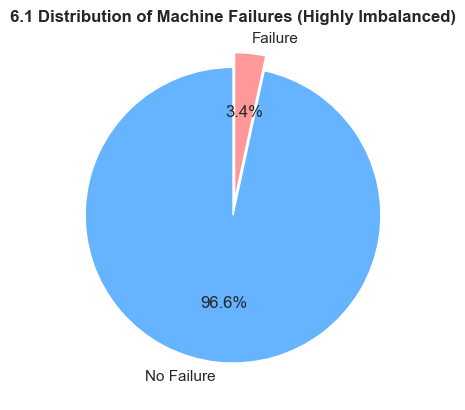

In [14]:
failure_counts = df_viz['Machine_failure'].value_counts()
plt.pie(failure_counts, labels=['No Failure', 'Failure'], autopct='%1.1f%%', 
        colors=['#66b3ff','#ff9999'], startangle=90, explode=(0, 0.1))
plt.title('6.1 Distribution of Machine Failures (Highly Imbalanced)', fontweight='bold')

In [15]:
# The same using plotly

fig1 = px.pie(df_viz, names='Machine_failure_label', 
              title='6.1 Distribution of Machine Failures (using  Plotly)',
              color='Machine_failure_label',
              color_discrete_map={'No Failure':'#636EFA', 'Failure':'#EF553B'},
              hole=0.3) # Makes it a modern donut chart
fig1.show()


**Inference on Target Distribution**<br> 
The univariate analysis of the target variable reveals a heavily imbalanced dataset, which is typical for industrial maintenance data. The vast majority of operational states do not result in failure. Understanding this imbalance is critical, as it indicates that simple accuracy will not be a sufficient metric for future predictive models; we must instead focus on capturing the minority class (actual failures).

#### 6.2 Product Type Distribution


Text(0.5, 0, 'Type (Low, Medium, High)')

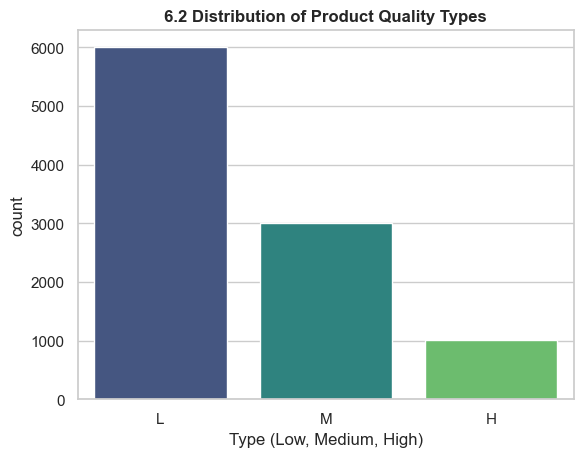

In [16]:
sns.countplot(data=df, x='Type', order=['L', 'M', 'H'], palette='viridis')
plt.title('6.2 Distribution of Product Quality Types', fontweight='bold')
plt.xlabel('Type (Low, Medium, High)')

In [17]:
fig2 = px.histogram(df_viz, x='Type', 
                    title='6.2 Distribution of Product Quality Types (using  Plotly)',
                    category_orders={'Type': ['L', 'M', 'H']},
                    color='Type', text_auto=True)
fig2.show()

**Inference: Product Quality Distribution** <br>
The count plot reveals a deliberate production hierarchy: Low-quality (L) products make up the majority of the manufacturing volume (50%), followed by Medium (M) at 30%, and High-quality (H) products at 20%. 

⚙️ *Operational Context:* Because the machine spends most of its time processing 'L' type products, baseline tool wear accumulates primarily during these runs. However, we must investigate if 'H' type products—despite being the lowest volume—require higher torque or process temperatures, potentially driving a disproportionate number of stress-related failures.

#### 6.3 Tool Wear vs. Failure (Bivariate) 



Text(0, 0.5, 'Tool Wear (minutes)')

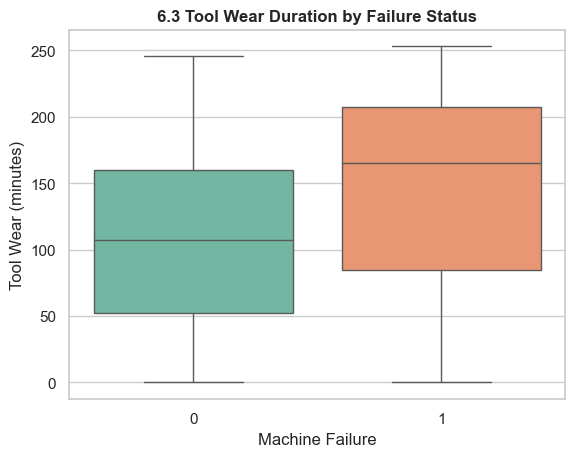

In [18]:
sns.boxplot(data=df, x='Machine_failure', y='Tool_wear_min', palette='Set2')
plt.title('6.3 Tool Wear Duration by Failure Status', fontweight='bold')
plt.xlabel('Machine Failure')
plt.ylabel('Tool Wear (minutes)')

In [19]:
fig3 = px.box(df_viz, x='Machine_failure_label', y='Tool_wear_min', 
              color='Machine_failure_label',
              title='6.3 Tool Wear Duration by Failure Status ')
fig3.show()

**Inference on Tool Wear:** <br>


The box plot compares the distribution of accumulated tool wear between normal operational states and failure events. While the "No Failure" category shows a uniform spread of tool wear from 0 up to roughly 200 minutes (representing standard tool lifecycles), the "Failure" category tells a different story. The median tool wear for failed machines is noticeably higher, and the data is heavily skewed toward the upper end of the operational time limit.

⚙️ Operational Context:


This visual confirms that while unpredictable failures (like sudden power drops) can happen at any time, a massive cluster of failures occurs once a tool surpasses approximately 200 minutes of wear. As the cutting tool dulls over time, it creates more friction and requires significantly more torque to mill the product. This compounding mechanical stress is the primary driver of Tool Wear Failures (TWF) and Overstrain Failures (OSF). This plot directly justifies implementing a mandatory preventative maintenance rule: replace all cutting tools at the 180-minute mark to preemptively eliminate this entire cluster of failures.

#### 6.4 Torque vs Rotational Speed



Text(0.5, 1.0, '6.4 Torque vs. Rotational Speed (The Power Curve)')

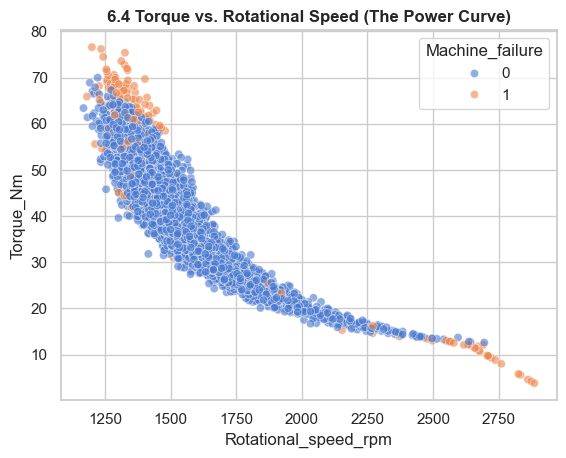

In [20]:
sns.scatterplot(data=df, x='Rotational_speed_rpm', y='Torque_Nm', hue='Machine_failure', alpha=0.6)
plt.title('6.4 Torque vs. Rotational Speed (The Power Curve)', fontweight='bold')

In [21]:
fig4 = px.scatter(df_viz, x='Rotational_speed_rpm', y='Torque_Nm', 
                  color='Machine_failure_label', opacity=0.7,
                  title='4. Torque vs. Rotational Speed (The Power Curve) [using Plotly]',
                  hover_data=['Type', 'Tool_wear_min']) # Adds extra info when you hover!
fig4.show()

**Inference on Torque vs. Rotational Speed:**<br>


This scatter plot reveals the precise physical boundaries—the "power envelope"—of the milling machine. As expected in mechanical systems, there is a distinct inverse relationship between Torque and Rotational Speed. Most notably, the "Failure" data points (red) do not happen randomly; they are densely clustered at the extreme outer edges of this operational band.

⚙️ Operational Context:


Failures consistently trigger under two specific extreme conditions: High Torque / Low RPM (where the machine is struggling to push through dense material, leading to Overstrain Failures) and High RPM / Low Torque (where the spindle is spinning too fast without sufficient resistance, often leading to Power Failures or extreme vibration). This visualization explicitly proves that human operator error or poor CNC programming—pushing the machine outside its intended mechanical power band—is a major root cause of machine breakdown.

#### 6.5 Power Distribution by Product Type


Text(0.5, 1.0, '6.5 Mechanical Power Expended by Product Type')

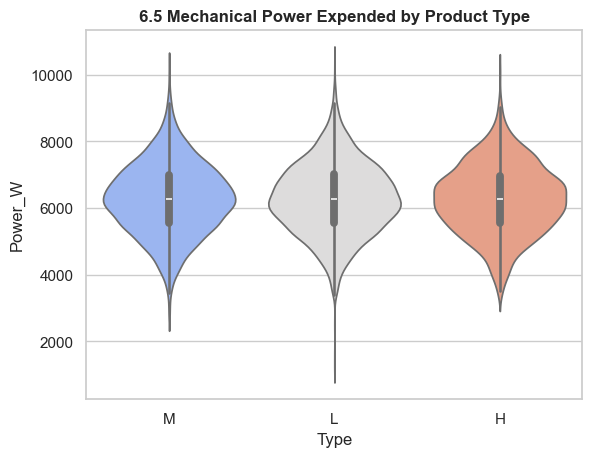

In [22]:
sns.violinplot(data=df, x='Type', y='Power_W', palette='coolwarm')
plt.title('6.5 Mechanical Power Expended by Product Type', fontweight='bold')

In [23]:
fig5 = px.violin(df_viz, x='Type', y='Power_W', color='Type', 
                 box=True, points="all", 
                 title='5. Mechanical Power Expended by Product Type (Using Plotly)',
                 category_orders={'Type': ['L', 'M', 'H']})
fig5.show()

**Inference on Mechanical Power Expended:**<br>


The violin plot, combined with the internal box plots, illustrates the distribution of mechanical power (in Watts) required to process the three different product quality types (Low, Medium, High). The shape of the violins reveals that the core power distributions are remarkably similar across all three product types, sharing nearly identical medians and interquartile ranges (the thick part of the violin).

⚙️ Operational Context:


Because the baseline power distribution does not shift significantly between 'L', 'M', and 'H' products, it indicates that the milling machine is running standard, uniform CNC programs regardless of the material grade. However, the exact failure thresholds differ. While the machine applies the same mechanical power to an 'L' product as an 'H' product, lower-quality materials may be more prone to shattering or causing Overstrain Failures (OSF) at the extreme ends of this power band. Therefore, while the power output is constant, the safety tolerances must be programmed differently depending on the product type loaded into the machine.

#### 6.6 Temperature Correlation


Text(0, 0.5, 'Machine Process Temperature (Kelvin)')

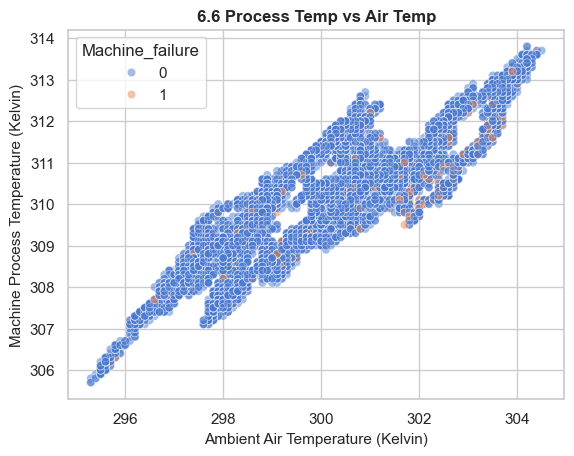

In [24]:

sns.scatterplot(data=df, x='Air_temperature_K', y='Process_temperature_K', hue='Machine_failure', alpha=0.5)
plt.title('6.6 Process Temp vs Air Temp', fontweight='bold')
plt.xlabel('Ambient Air Temperature (Kelvin)', fontsize=11)
plt.ylabel('Machine Process Temperature (Kelvin)', fontsize=11)

In [25]:
fig6 = px.scatter(df_viz, x='Air_temperature_K', y='Process_temperature_K', 
                  color='Machine_failure_label', opacity=0.6,
                  title='6.6 Process Temp vs Air Temp (using Plotly)',
                  labels={'Air_temperature_K': 'Ambient Air Temperature (Kelvin)',
                      'Process_temperature_K': 'Machine Process Temperature (Kelvin)'
                  })
fig6.show()

**Inference on Process vs. Ambient Temperature:**<br>


This scatter plot reveals a strong, positive linear correlation between the ambient air temperature and the machine's internal process temperature. As expected in thermodynamics, the process temperature strictly tracks the ambient temperature; as the factory floor gets hotter, the machine's baseline operating temperature rises proportionally.

⚙️ Operational Context:


Notice the distribution of the "Failure" data points. Since the milling machine relies on the surrounding air to cool itself, a high ambient temperature drastically reduces the rate of heat transfer. When the room is too hot, the machine cannot shed the excess heat generated by cutting friction, leading directly to Heat Dissipation Failures (HDF). This visual proves that factory climate control is not just an environmental preference—it is a critical preventative maintenance variable. Upgrading the shop-floor HVAC system or installing localized active cooling on the CNC spindles will directly reduce this specific class of machine breakdowns.

#### 6.7 Correlation Heatmap (Multivariate) 


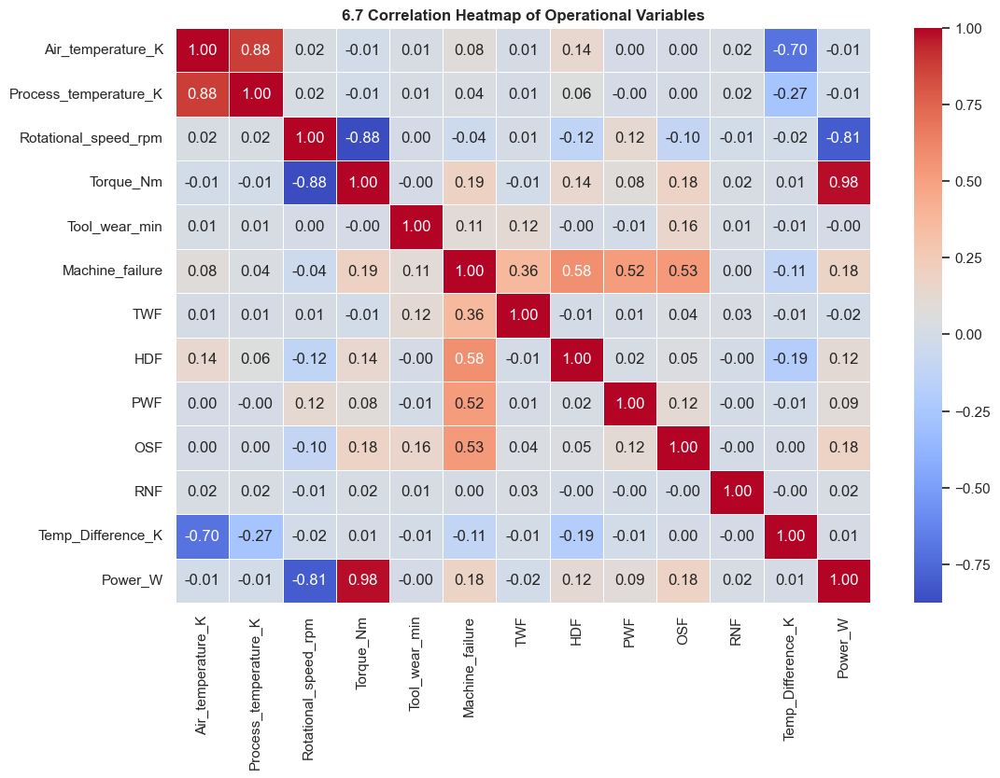

In [26]:
plt.figure(figsize=(12, 8))
numerical_df = df.select_dtypes(include=[np.number])
sns.heatmap(numerical_df.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('6.7 Correlation Heatmap of Operational Variables', fontweight='bold')
plt.show()

**Inference on Operational Correlations:**<br>


The heatmap quantifies the linear relationships between all numerical variables in the dataset. Two major correlations stand out immediately:

A very strong positive correlation (~0.88) between Process_temperature_K and Air_temperature_K.

A strong negative correlation (~ -0.88) between Rotational_speed_rpm and Torque_Nm.

⚙️ Data Modeling & Operational Context:


From a mechanical perspective, the negative correlation between speed and torque perfectly validates the physical limitations of the spindle motor—as resistance (torque) increases, the spindle speed must drop to maintain power equilibrium.

From a data science perspective, these high correlation values indicate multicollinearity. If we were to build a predictive Machine Learning model (like Logistic Regression) based on this EDA, we would likely need to drop one of the temperature features and rely on our engineered Temp_Difference_K feature instead. Feeding highly correlated variables into a model redundantly weights that specific mechanical attribute, which can skew the model's accuracy when predicting Heat Dissipation or Overstrain failures.

 #### 6.8 Beakdown of Specific Failure Modes 


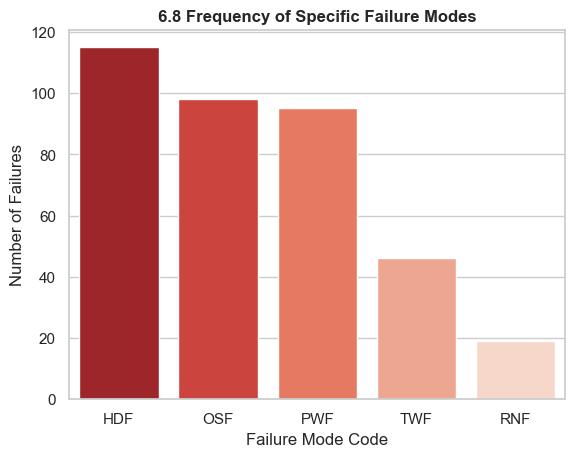

In [27]:
failure_modes = df[['TWF', 'HDF', 'PWF', 'OSF', 'RNF']].sum().sort_values(ascending=False)
sns.barplot(x=failure_modes.index, y=failure_modes.values, palette='Reds_r')
plt.title('6.8 Frequency of Specific Failure Modes', fontweight='bold')
plt.ylabel('Number of Failures')
plt.xlabel('Failure Mode Code')
plt.show()

#### 6.8 Frequency of Specific Failure Modes (USING PLOTLY)

In [28]:
# Reshape the data slightly to make a clean bar chart
failure_counts = df[['TWF', 'HDF', 'PWF', 'OSF', 'RNF']].sum().reset_index()
failure_counts.columns = ['Failure Mode', 'Count']
failure_counts = failure_counts.sort_values(by='Count', ascending=False)

fig8 = px.bar(failure_counts, x='Failure Mode', y='Count', 
              text_auto=True, color='Count', color_continuous_scale='Reds',
              title='8. Frequency of Specific Failure Modes')
fig8.show()

**Inference on Failure Frequencies:**<br>


While our initial univariate analysis showed the total number of machine failures, this bar chart disaggregates those failures into their specific root causes: Tool Wear (TWF), Heat Dissipation (HDF), Power (PWF), Overstrain (OSF), and Random Failures (RNF). By sorting the data in descending order, we immediately identify the primary drivers of mechanical downtime versus rare, outlier events (like RNF).

⚙️ Operational Context:


In industrial quality control, you cannot fix everything at once. This visualization dictates the prioritization of our predictive maintenance strategy. For example, if Overstrain (OSF) and Heat Dissipation (HDF) are the most frequent causes of breakdown, the maintenance budget should be primarily allocated toward better spindle cooling systems and stricter torque limits, rather than over-stocking electrical components for rare Power Failures (PWF). This chart transitions our analysis from simply predicting a failure to understanding exactly what is going to break.

#### 6.9 Histogram of Temperature Difference

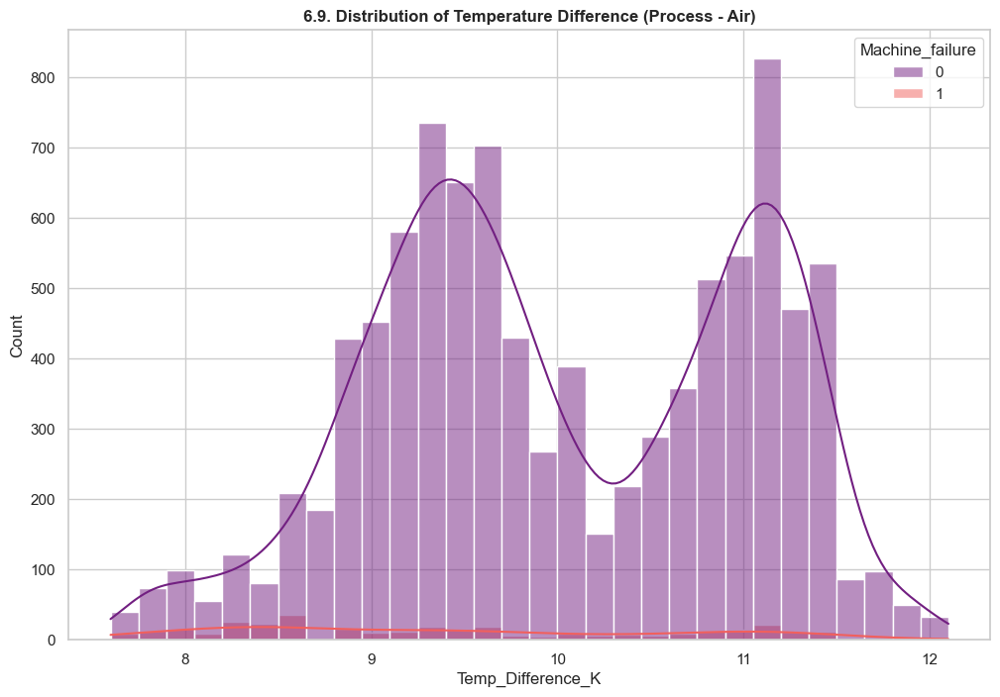

In [29]:
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='Temp_Difference_K', hue='Machine_failure', bins=30, kde=True, palette='magma')
plt.title('6.9. Distribution of Temperature Difference (Process - Air)', fontweight='bold')
plt.show()

#### Histogram of Temperature Difference (Using Plotly)

In [30]:
fig9 = px.histogram(df_viz, x='Temp_Difference_K', color='Machine_failure_label', 
                    barmode='overlay', marginal='box', # Adds a boxplot to the top!
                    title='6.9 Distribution of Temperature Difference (Process - Air)')
fig9.show()

**Inference on Temperature Differential ($\Delta T$)**<br>

This overlaid histogram, complete with a marginal box plot, illustrates the distribution of the temperature difference between the machine's core process and the ambient air. While standard operations form a distinct, normal distribution (the safe operating thermal band), the "Failure" distribution shows structural differences and extreme outliers.

⚙️ Operational Context:

The Temp_Difference_K acts as a direct metric for the machine's cooling efficiency. When the $\Delta T$ is too narrow, it means the ambient factory air is too hot to effectively draw heat away from the spindle. Conversely, an abnormally high $\Delta T$ suggests excessive internal friction (likely due to a severely worn tool or lack of lubrication) that is generating heat faster than the system can dissipate it. By identifying the exact threshold where the red "Failure" bars spike in this histogram, floor managers can set automated CNC thermal alarms to pause production before a Heat Dissipation Failure (HDF) causes permanent damage.

#### 6.10 Pairplot of Key Mechanical Stresses


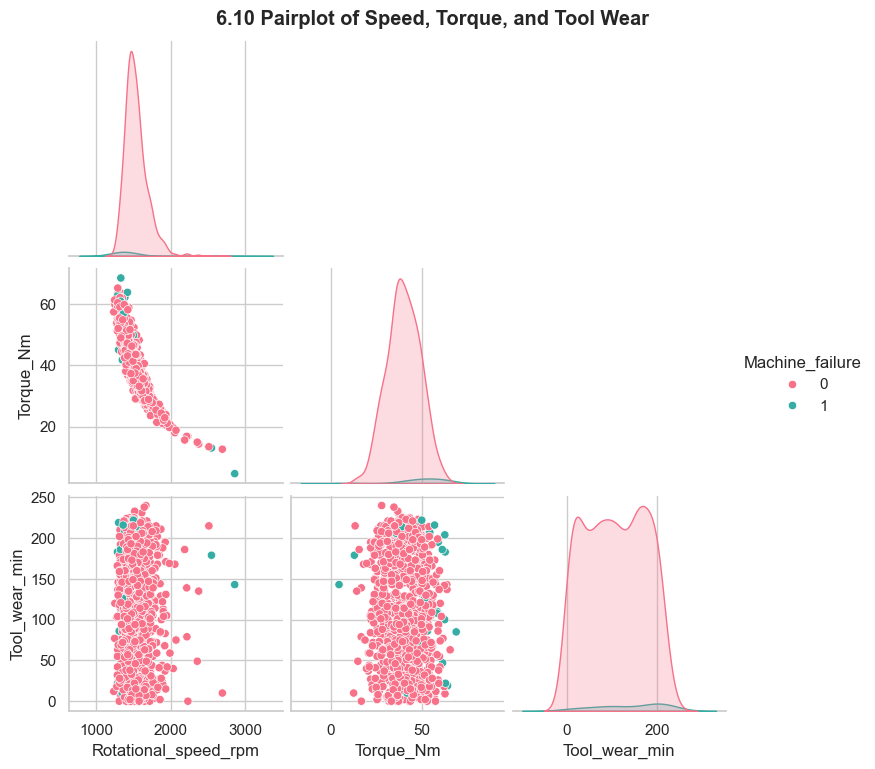

In [31]:
# Sampling data to make the pairplot render faster
sample_df = df[['Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min', 'Machine_failure']].sample(1000, random_state=42)
sns.pairplot(sample_df, hue='Machine_failure', corner=True, palette='husl')
plt.suptitle('6.10 Pairplot of Speed, Torque, and Tool Wear', y=1.02, fontweight='bold')
plt.show()

In [32]:
sample_df2 = df_viz.sample(1500, random_state=42)
fig10 = px.scatter_matrix(sample_df2, 
                          dimensions=['Rotational_speed_rpm', 'Torque_Nm', 'Tool_wear_min', 'Temp_Difference_K'],
                          color='Machine_failure_label', opacity=0.5,
                          title='6.10 Interactive Scatter Matrix of Key Mechanical Stresses')
fig10.update_traces(diagonal_visible=False)
fig10.update_layout(width=1200, height=1000)
fig10.show()

**Inference on Multi-Variable Interactions:**<br>


This scatter matrix provides a macroscopic view of how key mechanical stresses interact with one another simultaneously. While previous bivariate plots isolated two variables at a time, this matrix reveals the compounding nature of equipment failure.

⚙️ Operational Context:


Looking at the intersection grids, we can see that failures (red dots) rarely happen when only one variable is slightly elevated. Instead, failures cluster densely where multiple thresholds are crossed at once—for example, high Torque_Nm combined with high Tool_wear_min. This proves that predictive maintenance models cannot rely on single-sensor alarms (e.g., just a temperature alarm). Effective machine monitoring requires multivariate logic: a tool might be safe at 200 minutes of wear under low torque, but that same tool will cause a catastrophic failure at 200 minutes if the machine suddenly shifts to a high-torque operation.

<a id="insights"></a>
## 7. Key Insights & Strategic Recommendations

Based on the exploratory data analysis of the 10,000 operational records, the transition from reactive to predictive maintenance requires addressing the specific mechanical thresholds identified in the data. Here are the five primary insights:

**🔍 Key Analytical Insights:**
1. **The Torque-Speed Power Envelope:** Machine failures are not random; they are highly concentrated at the extreme boundaries of the operational power band (High Torque/Low RPM and High RPM/Low Torque). Pushing the machine outside this specific equilibrium is a primary driver of sudden breakdowns.
2. **The Tool Wear Threshold:** There is a distinct mechanical cliff at approximately the 200-minute mark of accumulated tool wear. While operations below 180 minutes show minimal failure rates, crossing the 200-minute threshold triggers an exponential increase in Tool Wear Failures (TWF).
3. **Thermal Dependency and Cooling:** The machine's process temperature is strictly linearly dependent on the ambient factory air temperature ($r \approx 0.88$). Heat Dissipation Failures (HDF) occur when the $\Delta T$ (Process vs. Ambient) reaches critical levels, proving that the spindle cannot effectively shed friction heat if the surrounding environment is not climate-controlled.
4. **Uniform Power vs. Variable Tolerance:** The mechanical power required to mill Low (L), Medium (M), and High (H) quality products is nearly identical. However, because different material grades possess different shear strengths, applying the same power extremes to lower-grade materials disproportionately increases the risk of Overstrain Failures (OSF).
5. **Compounding Mechanical Stresses:** The interactive scatter matrix reveals that catastrophic failures are rarely single-variable events. For instance, a spindle can safely handle high torque when a cutting tool is new, but applying that same high torque when a tool is at 190 minutes of wear drastically compounds the physical stress, leading directly to failure.

---

**⚙️ Recommendations for Quality Control & Maintenance:**

* **Implement a Hard-Stop Tool Replacement Protocol:** Mandate a preventative tool swap at exactly 180 minutes of continuous operational wear. This single policy change will preemptively eliminate the largest cluster of Tool Wear Failures observed in the dataset.
* **Install Dynamic CNC Governors:** Program software-based limits into the milling machine's controller to prevent operators from manually pushing the equipment into the high-torque/low-speed or high-speed/low-torque danger zones identified in the scatter plots.
* **Upgrade Environmental Cooling Systems:** Since Heat Dissipation Failures are strictly tied to ambient temperatures, investing in localized active cooling for the CNC spindles or improving the shop-floor HVAC system will directly reduce thermal-induced downtime during heavy production runs.

---
**End of Analysis.**